In [1]:
# !pip install datasets

In [49]:
from datasets import load_dataset

# data_path = "data/BrushData/00249-002.tar"
data_path = "data/heguan-reformed/000.tar"

train_dataset = load_dataset("webdataset", 
                data_files={"train": data_path}, 
                split="train", 
                streaming=True)

In [50]:
train_dataset

IterableDataset({
    features: ['__key__', '__url__', 'caption', 'height', 'image', 'segmentation', 'width'],
    n_shards: 1
})

In [51]:
train_dataset.info.features

{'__key__': Value(dtype='string', id=None),
 '__url__': Value(dtype='string', id=None),
 'caption': Value(dtype='binary', id=None),
 'height': Value(dtype='binary', id=None),
 'image': Value(dtype='binary', id=None),
 'segmentation': Value(dtype='binary', id=None),
 'width': Value(dtype='binary', id=None)}

In [126]:
i = 0
for example in iter(train_dataset):
    if i >= 2:
        break
    
    i += 1
    
example

{'__key__': 'urbanic-c61abb925dc04645bdf40b353c7a5604',
 '__url__': '/home/ec2-user/SageMaker/efs/Projects/BrushNet/data/heguan-reformed/000.tar',
 'caption': b'neckline: shirt collar, Shorts Co-ords, design detail: others, pattern: solid, chest pad: no, sleeve type: regular sleeve, length: short, lining: no, unit: piece, belt: no, sleeve length: short sleeve, color: green, silhouette: s-line, main material: polyester, season: summer, fitness: slim fit, classification: fashion, style: casual, hsn chapters: 61, stretchability: moderately stretchable',
 'height': b'2667',
 'image': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\

In [127]:
import cv2
import numpy as np
import json

caption=example["caption"].decode('utf-8')
height=int(example["height"].decode('utf-8'))
width=int(example["width"].decode('utf-8'))
image = cv2.imdecode(np.asarray(bytearray(example["image"]), dtype="uint8"), cv2.IMREAD_COLOR)
segmentation = json.loads(example["segmentation"])

In [128]:
print(f"caption: {caption}")

caption: neckline: shirt collar, Shorts Co-ords, design detail: others, pattern: solid, chest pad: no, sleeve type: regular sleeve, length: short, lining: no, unit: piece, belt: no, sleeve length: short sleeve, color: green, silhouette: s-line, main material: polyester, season: summer, fitness: slim fit, classification: fashion, style: casual, hsn chapters: 61, stretchability: moderately stretchable


In [129]:
print(f"height: {height}, width: {width}, image shape: {image.shape}")

height: 2667, width: 2000, image shape: (2667, 2000, 3)


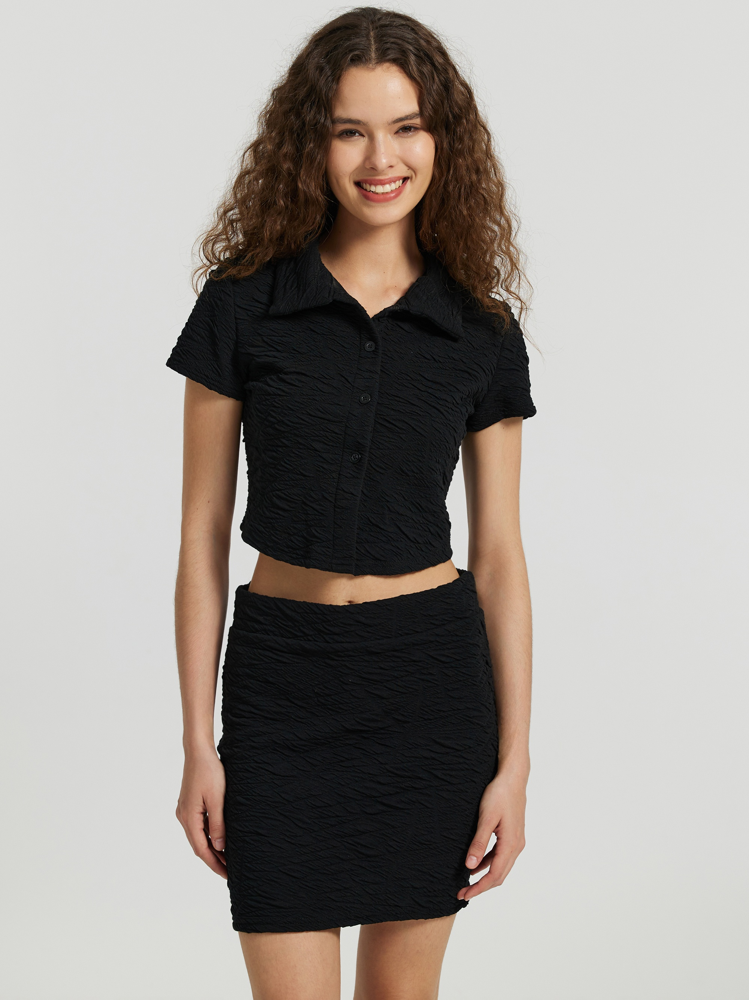

In [ ]:
from PIL import Image

image_ = Image.fromarray(image[..., ::-1], 'RGB')
image_

In [131]:
len(segmentation['mask'])

3

In [132]:
import random

def rle2mask(mask_rle, shape):# height width
    # Decode rle encoded mask.
    mask_rle=np.array(mask_rle)
    starts, lengths = [np.asarray(x, dtype=int) for x in (mask_rle[0:][::2], mask_rle[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape, order='F')

if len(segmentation["mask"])>0:
    mask=rle2mask(random.choice(segmentation["mask"]),(height,width))[:,:,np.newaxis]
    # mask=rle2mask(segmentation["mask"][0],(height,width))[:,:,np.newaxis]
else:
    mask=np.ones_like(image)[:,:,[0]]
    
masked_image=image*mask

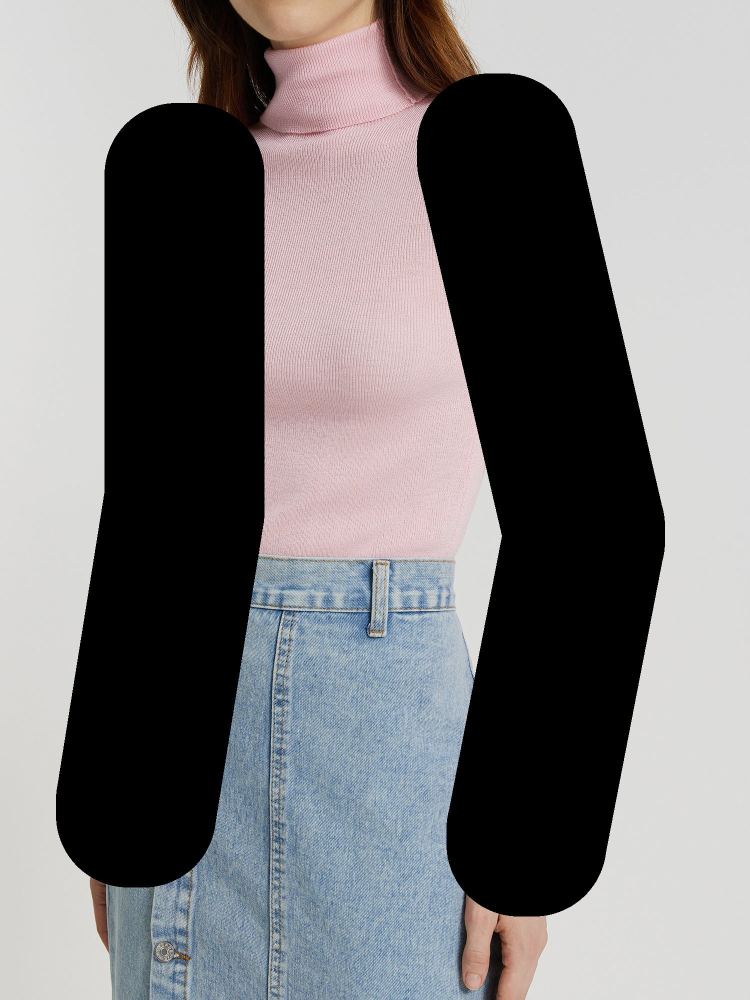

In [125]:
from PIL import Image

masked_image_ = Image.fromarray(masked_image[:, :, ::-1], 'RGB')
masked_image_

In [117]:
# import os
# import pickle

# # prefix = "data/BrushData/00200-029/002000149"
# prefix = "data/heguan-reformed/urbanic-af0f01b7e9424ae0b14c14350864b29e"
# suffix = ".height"
# suffix = ".width"
# # suffix = ".image"
# # suffix = ".caption"

# with open(prefix+suffix, 'rb') as fin:
#     # content = pickle.load(fin)
#     content = fin.read()

# content

In [93]:
# from PIL import Image

# image_ = Image.fromarray(image[..., ::-1], 'RGB')
# image_